In [8]:
import anndata as ad
import matplotlib.pyplot as plt
from plotnine import *
import numpy as np
import pandas as pd
from prismo import PRISMO
from prismo.pl import plot_training_curve, plot_covariates_factor_scatter, plot_top_weights, plot_variance_explained, plot_smoothness, plot_factor_correlation

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



In [29]:
model = PRISMO.load("model.h5")

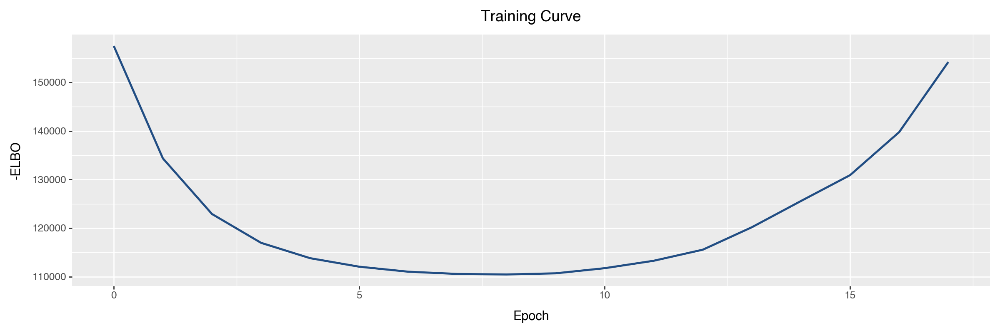

In [30]:
plot_training_curve(model)

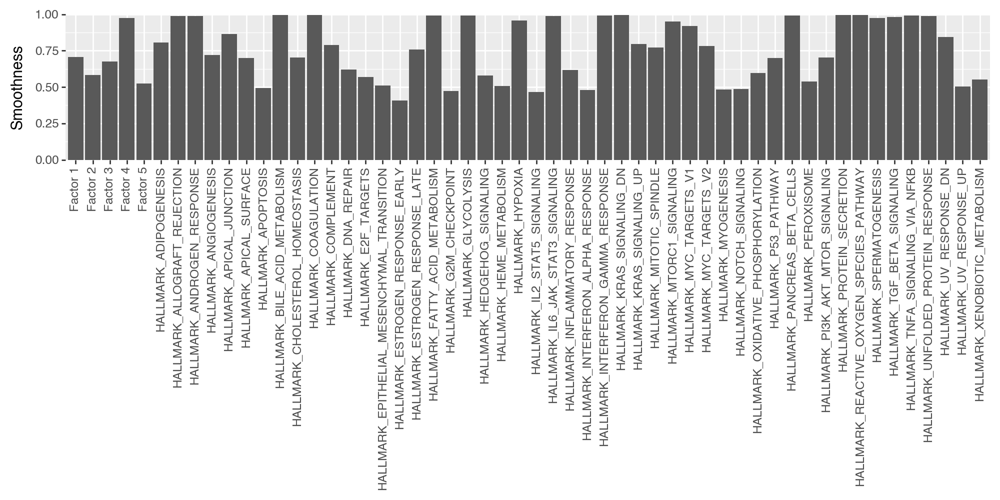

In [31]:
plot_smoothness(model, figsize=(10, 5))

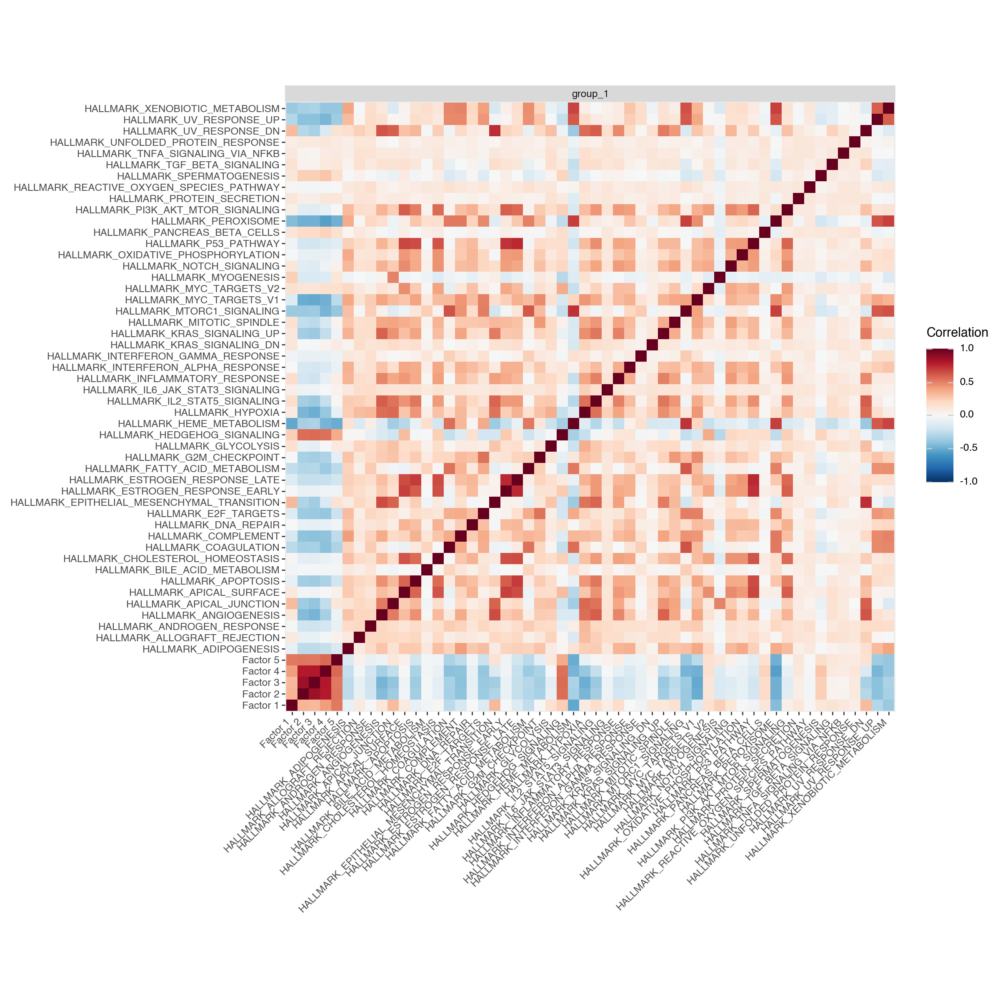

In [32]:
plot_factor_correlation(model, figsize=(12, 12))

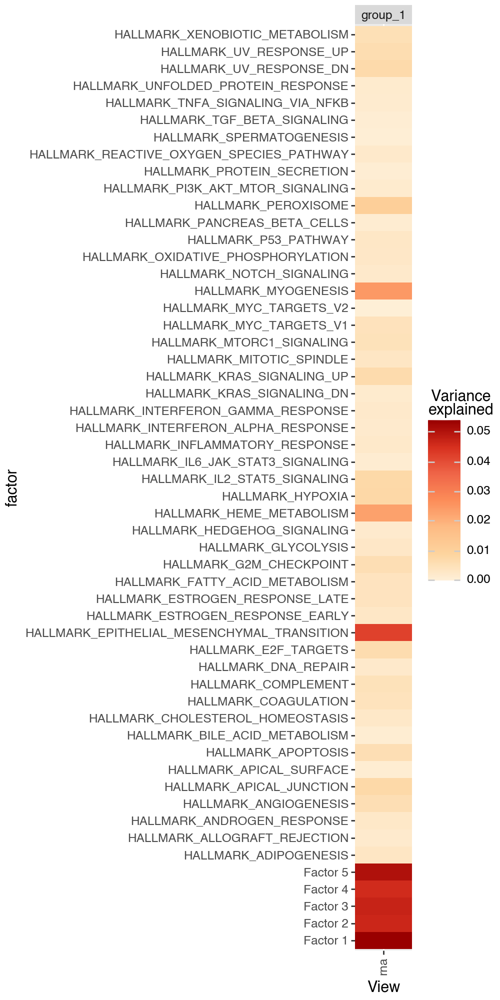

In [33]:
plot_variance_explained(model, figsize=(5, 10))

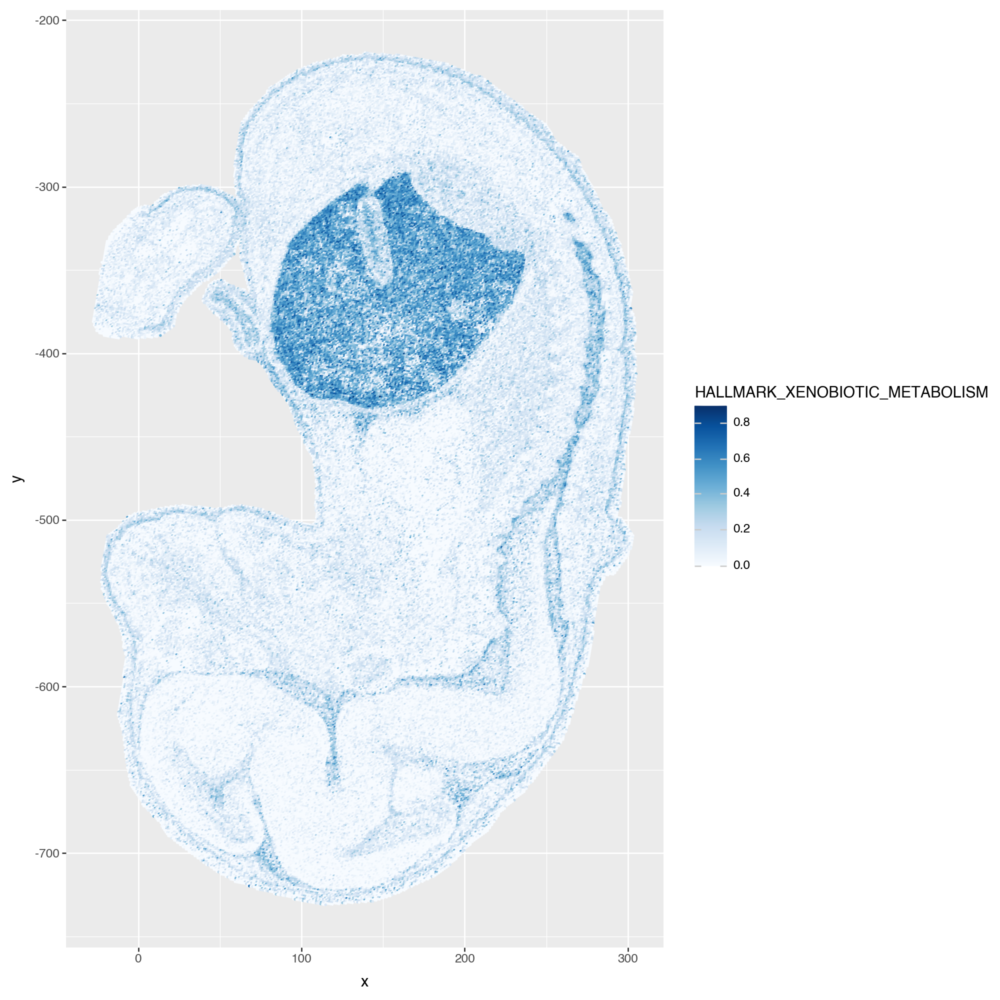

In [34]:
z  = model.get_factors()["group_1"]
z["x"] = model.covariates["group_1"][:, 0]
z["y"] = model.covariates["group_1"][:, 1]

plot = (
    ggplot(z, aes(x="x", y="y", color="HALLMARK_XENOBIOTIC_METABOLISM"))
    + geom_point(size=0.1)
    + theme(figure_size=(10, 10))
    + scale_color_cmap("Blues")
)
plot.show()

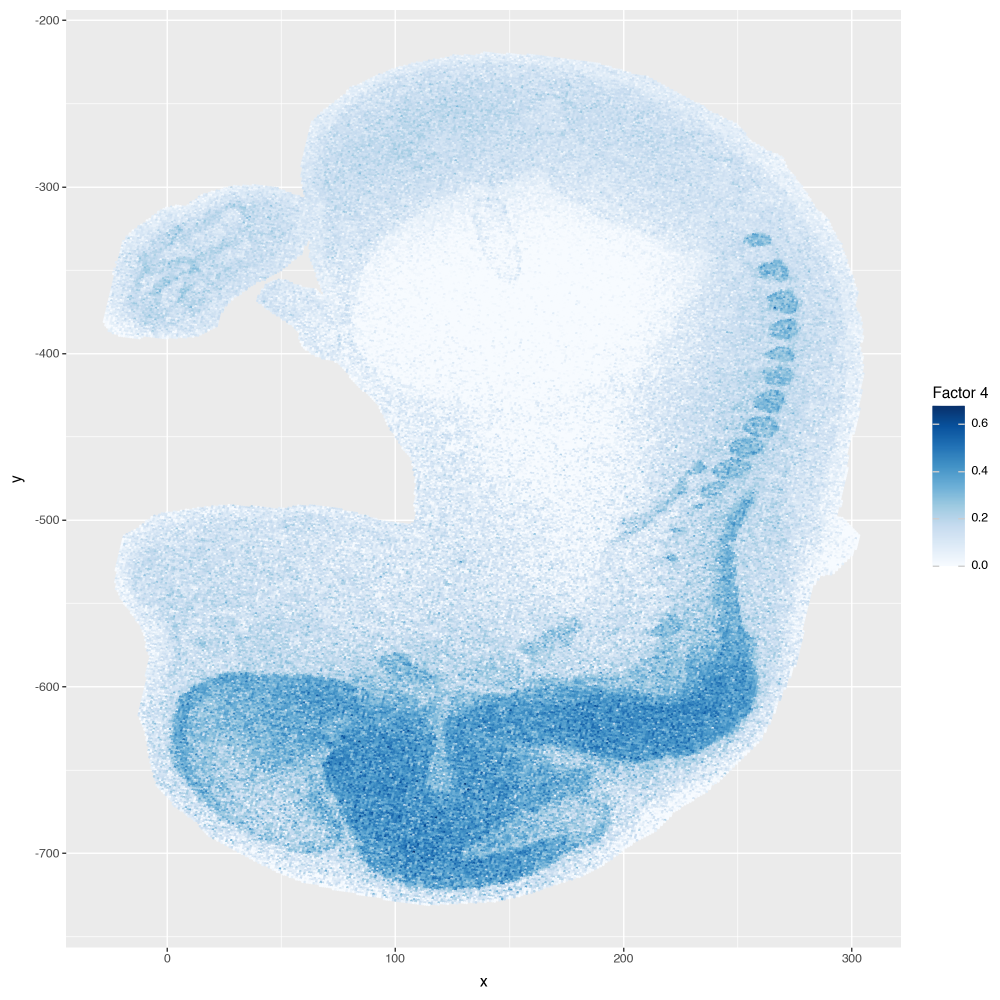

In [35]:
z  = model.get_factors()["group_1"]
z["x"] = model.covariates["group_1"][:, 0]
z["y"] = model.covariates["group_1"][:, 1]

plot = (
    ggplot(z, aes(x="x", y="y", color="Factor 4"))
    + geom_point(size=0.1)
    + theme(figure_size=(10, 10))
    + scale_color_cmap("Blues")
)
plot.show()

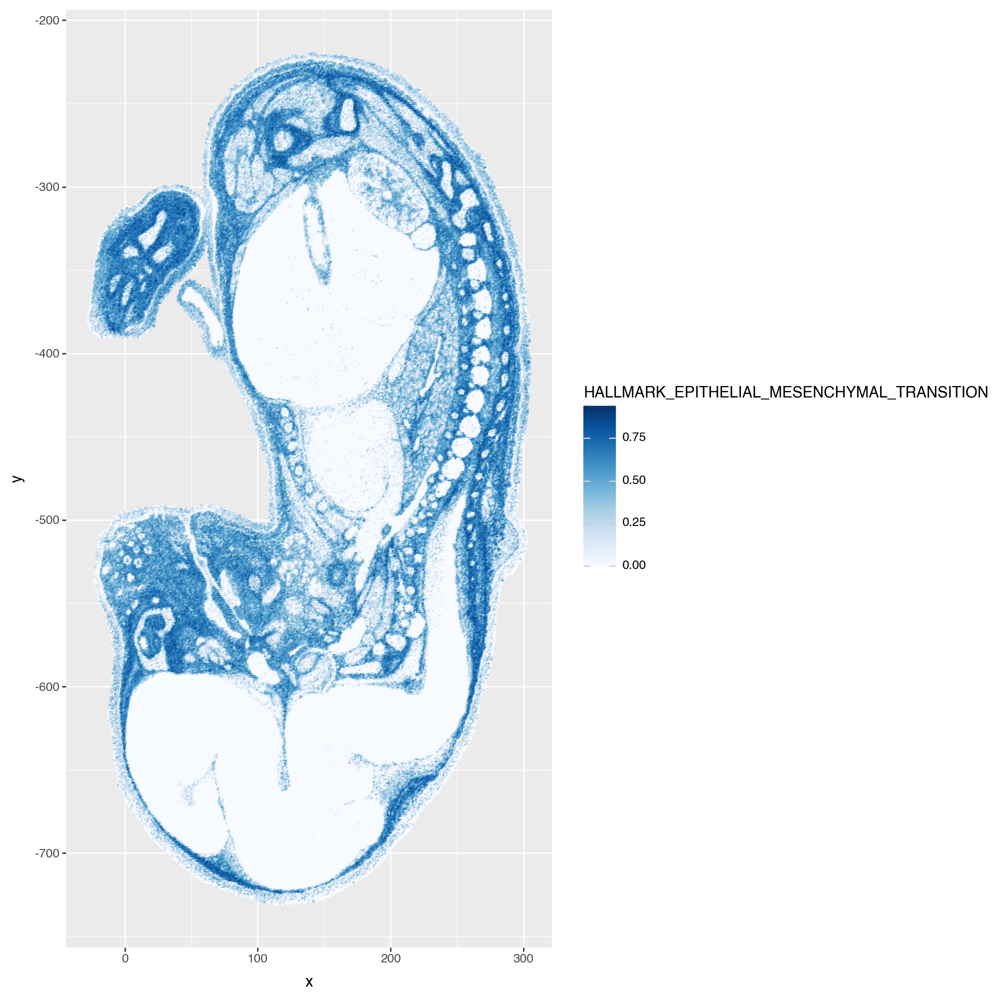

In [36]:
z  = model.get_factors()["group_1"]
z["x"] = model.covariates["group_1"][:, 0]
z["y"] = model.covariates["group_1"][:, 1]

plot = (
    ggplot(z, aes(x="x", y="y", color="HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION"))
    + geom_point(size=0.1)
    + theme(figure_size=(10, 10))
    + scale_color_cmap("Blues")
)
plot.show()

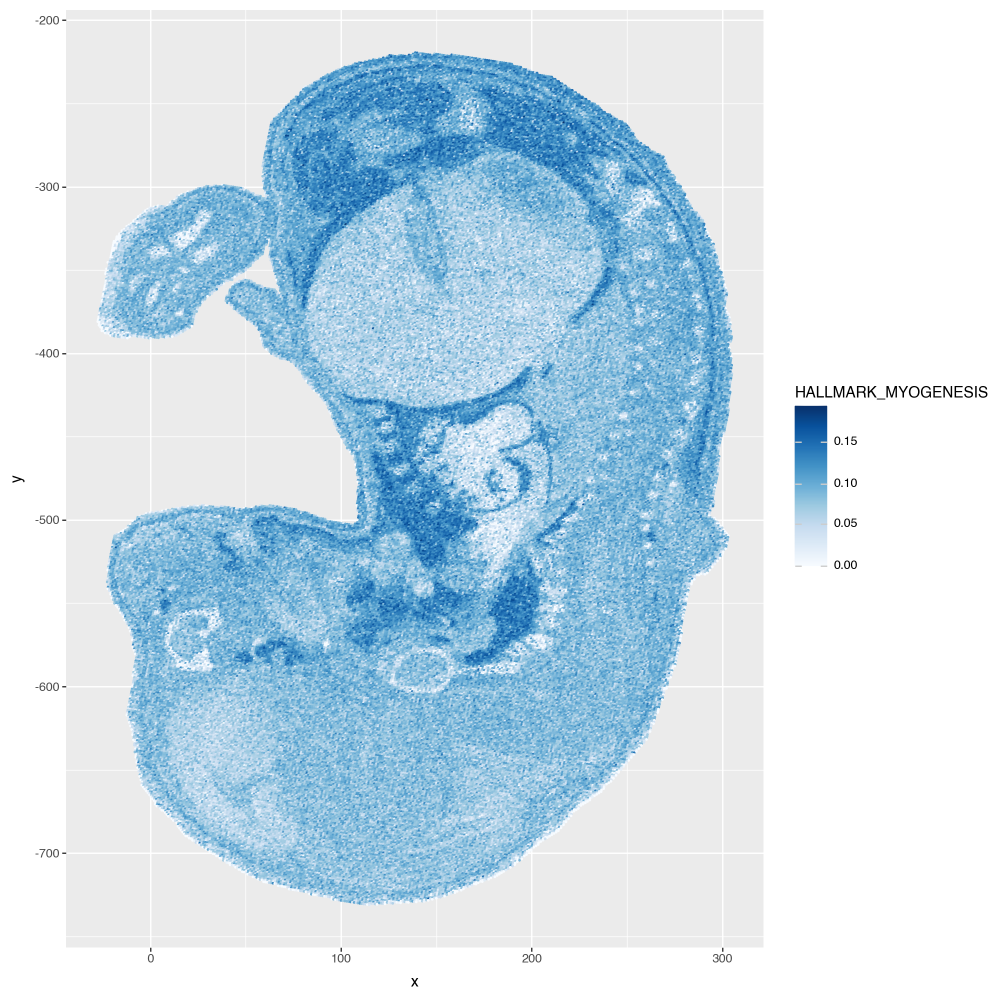

In [28]:
z  = model.get_factors()["group_1"]
z["x"] = model.covariates["group_1"][:, 0]
z["y"] = model.covariates["group_1"][:, 1]

plot = (
    ggplot(z, aes(x="x", y="y", color="HALLMARK_MYOGENESIS"))
    + geom_point(size=0.1)
    + theme(figure_size=(10, 10))
    + scale_color_cmap("Blues")
)
plot.show()

In [11]:
data = ad.read_h5ad("data/Mouse_olfa_S1.h5ad")

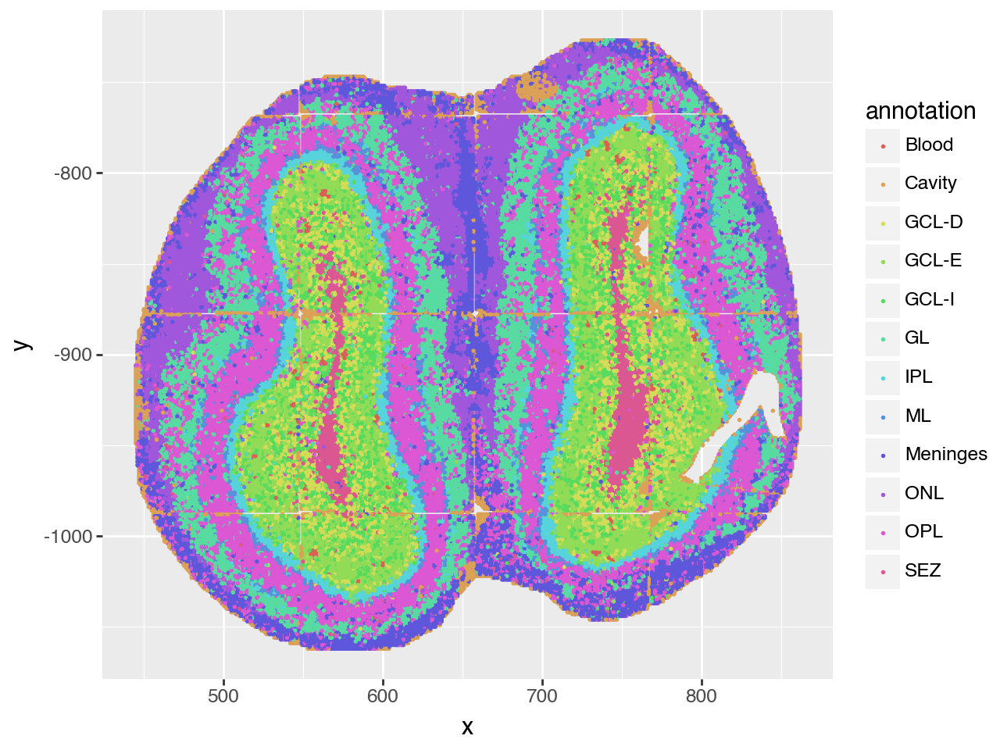

In [16]:
data.obs["x"] = data.obsm["spatial"][:, 0]
data.obs["y"] = data.obsm["spatial"][:, 1]

plot = (
    ggplot(data.obs, aes(x="x", y="y", color="annotation"))
    + geom_point(size=0.1)
)
plot.show()

In [70]:
z = model.get_factors()["group_1"]
z["annotation"] = model._metadata["group_1"]["rna"]["annotation"]

z_long = pd.melt(z, id_vars=["annotation"], var_name="factor", value_name="value")
z_long["factor"] = z_long["factor"].str.replace("HALLMARK_", "").str.replace("_", " ").str.title()

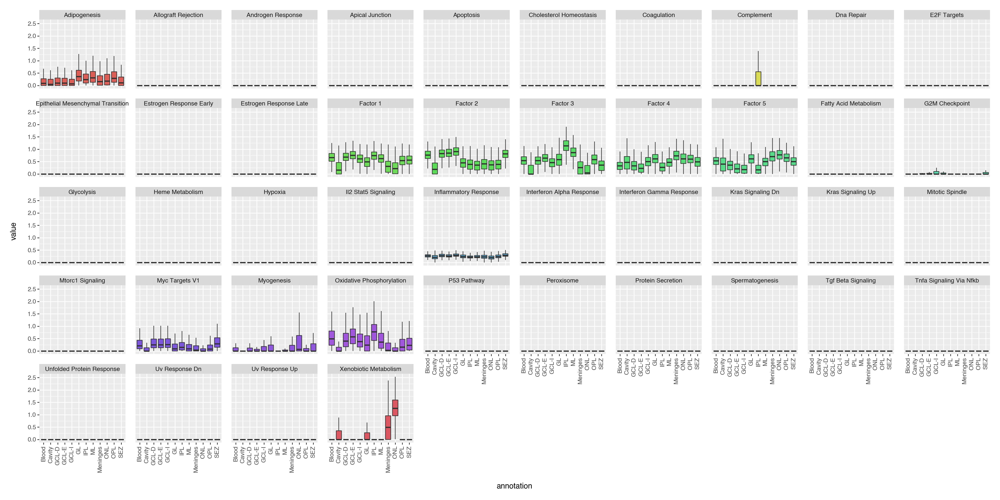

In [71]:
plot = (
    ggplot(z_long, aes(x="annotation", y="value", fill="factor"))
    + geom_boxplot(position="dodge", outlier_shape=None)
    + theme(axis_text_x=element_text(rotation=90, hjust="center"), figure_size=(20, 10))
    + facet_wrap("factor", ncol=10)
    + guides(fill=False)
)
plot.show()